# Ecualizador Digital usando Filtro Pasabandas

Un ecualizador es esencial en sistemas de audio por su capacidad para adaptar la respuesta en frecuencia según las preferencias individuales y las características acústicas del entorno. Permite la personalización del sonido, la compensación de problemas acústicos, la mejora de la claridad y definición, y la corrección de irregularidades en la respuesta en frecuencia. Además, facilita el control preciso de realces o atenuaciones, adaptándose a diferentes géneros musicales y tipos de contenido.

![EQ2](eq2.jpg)
![EQ1](eq1.jpg)

# Diseño de Filtros pasabandas

In [1]:
# Pasa bajas
#if(n == 0):
#    hn[i] = wc/np.pi
#else:
#    hn[i] = (wc/np.pi)*np.sin(wc*n)/(wc*n)

# # Pasa altas
# if(n == 0):
#     hn = 1-wc/np.pi
# else:
#     hn = -(wc/np.pi)*np.sin(wc*n)/(wc*n)
    
# # Pasa bandas
# if(n == 0):
#     hn = wc2/np.pi - wc1/np.pi
# else:
#     hn = (wc2/np.pi)*np.sin(wc2*n)/(wc2*n)-(wc1/np.pi)*np.sin(wc1*n)/(wc1*n)

# # Rechaza bandas
# if(n == 0):
#     hn = 1 - (wc2/np.pi - wc1/np.pi)
# else:
#     hn = (wc1/np.pi)*np.sin(wc1*n)/(wc1*n) - (wc2/np.pi)*np.sin(wc2*n)/(wc2*n)

import numpy as np
import matplotlib.pyplot as plt

filters = []
freqs= [63, 125, 250, 500, 1000, 2000, 4000, 8000, 16000]

for fr in freqs:
    fc1 = fr/np.sqrt(2)
    fc2 = fr*np.sqrt(2)
    if fr == 16000:
        fc2 = 22000 # Para no violar teorema del muestreo  
    fs = 44100
    ripple = 0.004
    fm = 20
    print("Frecuencia inferior: ",fc1)
    print("Frecuencia superior: ",fc2)

    # Normalizando
    wc1 = (2*np.pi*fc1)/fs
    wc2 = (2*np.pi*fc2)/fs
    delta_db = 20*np.log10(ripple)
    print("Delta_db:", delta_db)

    # Hallando N (orden)
    N = (4*fs)/(fm)+1
    # print("Orden:", N)
    n_array = np.arange(-(N-1)/2, (N-1)/2+1,1)
    hn = np.empty_like(n_array)

    # Calculando filtro
    filtro = 0;
    for i, n in enumerate(n_array):
        # Pasa bandas
        if(n == 0):
            hn[i] = wc2/np.pi - wc1/np.pi
        else:
            hn[i] = (wc2/np.pi)*np.sin(wc2*n)/(wc2*n)-(wc1/np.pi)*np.sin(wc1*n)/(wc1*n)

    # Volviendo causal        
    n_array = n_array + (N-1)/2

    # Ventana
    # win = 1/2*(1-np.cos((2*np.pi*n)/(N-1))) # Hanning
    win = 0.54 - 0.46*np.cos((2*np.pi*n_array)/(N-1)) # Hamming
    # win = 0.42 - 0.5*np.cos((2*np.pi*n)/(N-1)) + 0.08*np.cos((4*np.pi*n)/(N-1)) # Blackman

    # Multiplicando ventana y filtro
    hn_prima = hn * win
    
    # Agrega los coeficientes al conjunto total
    filters.append(hn_prima)
    print(" ")

print(len(filters[0]))


Frecuencia inferior:  44.54772721475249
Frecuencia superior:  89.095454429505
Delta_db: -47.95880017344075
 
Frecuencia inferior:  88.38834764831843
Frecuencia superior:  176.7766952966369
Delta_db: -47.95880017344075
 
Frecuencia inferior:  176.77669529663686
Frecuencia superior:  353.5533905932738
Delta_db: -47.95880017344075
 
Frecuencia inferior:  353.5533905932737
Frecuencia superior:  707.1067811865476
Delta_db: -47.95880017344075
 
Frecuencia inferior:  707.1067811865474
Frecuencia superior:  1414.213562373095
Delta_db: -47.95880017344075
 
Frecuencia inferior:  1414.2135623730949
Frecuencia superior:  2828.42712474619
Delta_db: -47.95880017344075
 
Frecuencia inferior:  2828.4271247461897
Frecuencia superior:  5656.85424949238
Delta_db: -47.95880017344075
 
Frecuencia inferior:  5656.8542494923795
Frecuencia superior:  11313.70849898476
Delta_db: -47.95880017344075
 
Frecuencia inferior:  11313.708498984759
Frecuencia superior:  22000
Delta_db: -47.95880017344075
 
8821


Frecuencia inferior:  44.54772721475249
Frecuencia superior:  89.095454429505


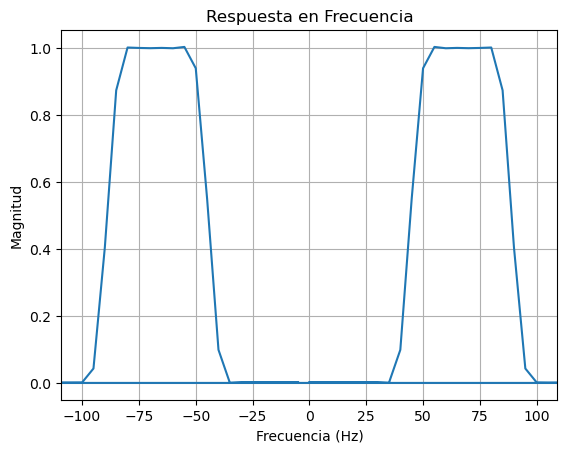

Frecuencia inferior:  88.38834764831843
Frecuencia superior:  176.7766952966369


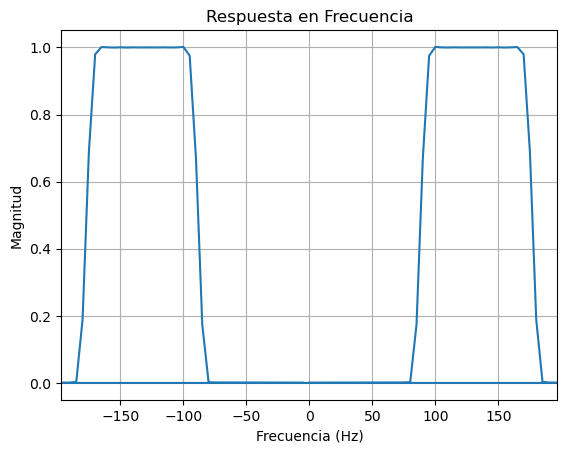

Frecuencia inferior:  176.77669529663686
Frecuencia superior:  353.5533905932738


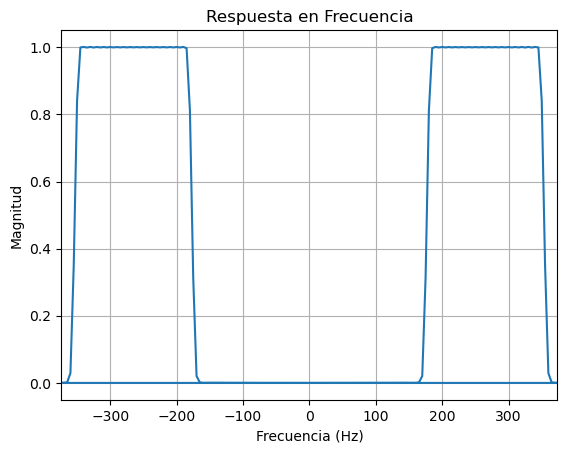

Frecuencia inferior:  353.5533905932737
Frecuencia superior:  707.1067811865476


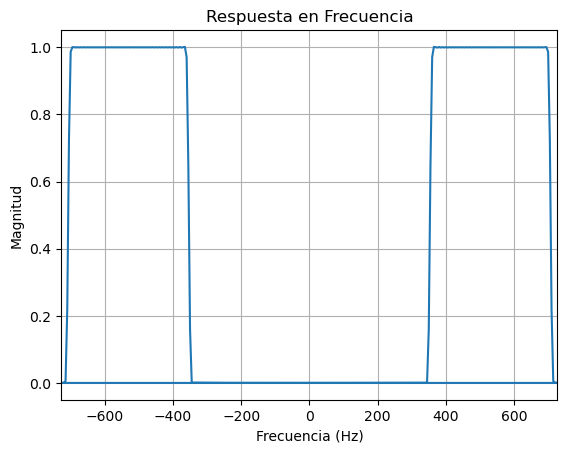

Frecuencia inferior:  707.1067811865474
Frecuencia superior:  1414.213562373095


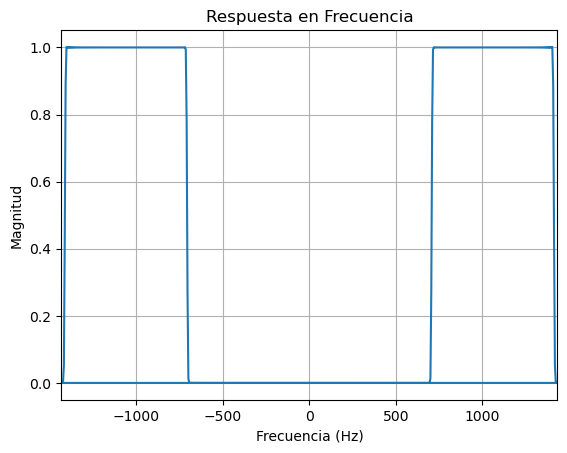

Frecuencia inferior:  1414.2135623730949
Frecuencia superior:  2828.42712474619


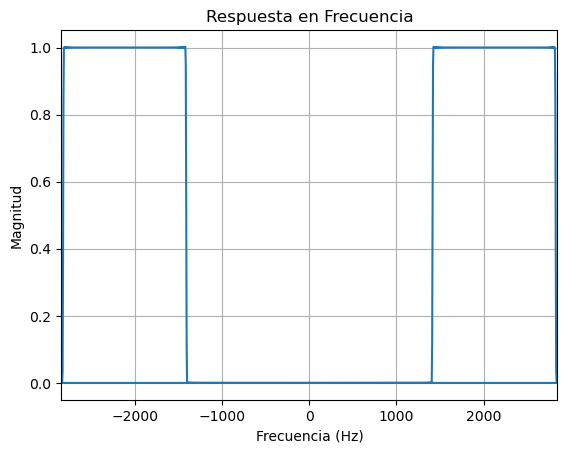

Frecuencia inferior:  2828.4271247461897
Frecuencia superior:  5656.85424949238


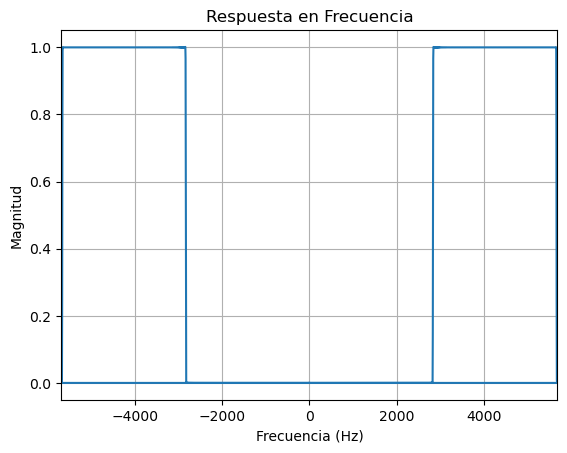

Frecuencia inferior:  5656.8542494923795
Frecuencia superior:  11313.70849898476


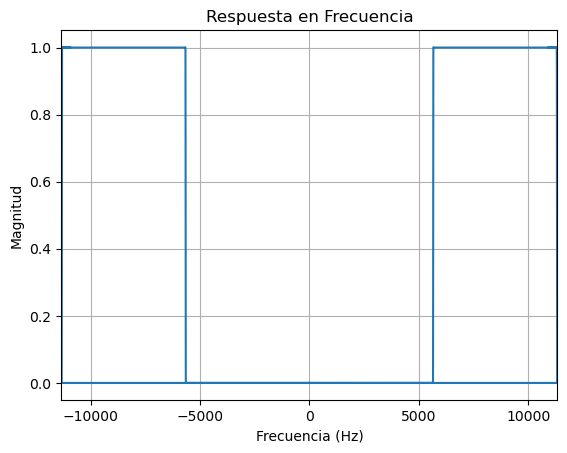

Frecuencia inferior:  11313.708498984759
Frecuencia superior:  22627.41699796952


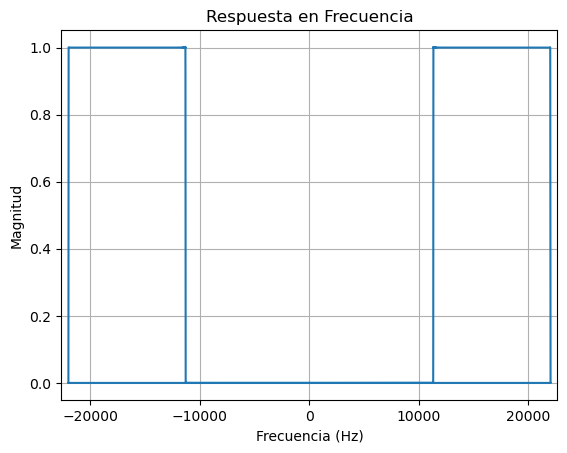

In [10]:
freqs= [63, 125, 250, 500, 1000, 2000, 4000, 8000, 16000]
fs = 44100

for i, value in enumerate(freqs):
    fc1 = value/np.sqrt(2)
    fc2 = value*np.sqrt(2)
    print("Frecuencia inferior: ",fc1)
    print("Frecuencia superior: ",fc2)
    # Transformada de Fourier discreta (DFT)
    frequencies = np.fft.fftfreq(len(filters[i]), d=1/fs)
    respuesta_frecuencia = np.fft.fft(filters[i])

    # Graficar la respuesta en frecuencia
    plt.plot(frequencies, np.abs(respuesta_frecuencia))
    plt.title('Respuesta en Frecuencia')
    plt.xlabel('Frecuencia (Hz)')
    plt.ylabel('Magnitud')
    plt.grid(True)
    plt.xlim(-fc2-20,fc2+20)
    plt.show()

# Audio de prueba

44100


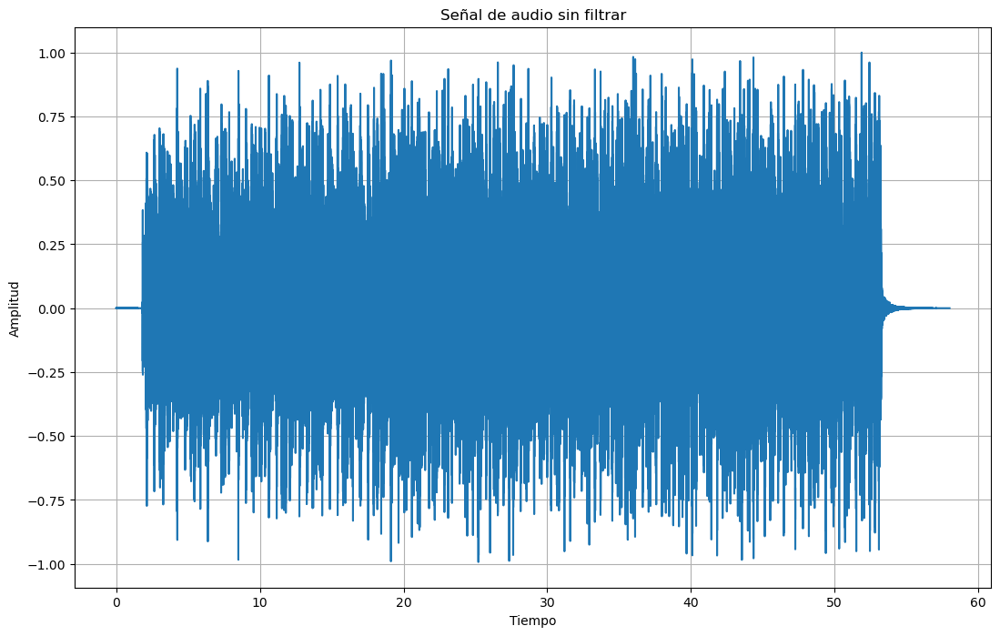

In [2]:
from IPython.display import Audio, display
from scipy.io.wavfile import read
from pydub import AudioSegment
import librosa

#archivo=('audio1.wav')
archivo=('mambo.wav')
#archivo=('twinsen2.wav')
#archivo=('bohemian.wav')

# Carga el archivo de audio
audio, fs = librosa.load(archivo, sr= 44100)
print(fs)
#audio=audio/float(max(abs(audio)))
max_abs_value = float(np.max(np.abs(audio)))
audio = audio / max_abs_value
audio = audio - np.mean(audio)

# Convert audio to 16-bit integer format
t=np.arange(0, float(len(audio))/fs, 1.0/fs)

plt.figure(figsize=(13,8))
plt.xlabel('Tiempo')
plt.ylabel('Amplitud')
plt.plot(t,audio)
plt.title('Señal de audio sin filtrar')
plt.grid()
display(Audio(data=audio, rate=fs))

# Ecualizador digital (Interfaz)

In [25]:
import ipywidgets as widgets
from IPython.display import display

n_filters = len(filters)
gain = [1] * n_filters

# Definir una función que se ejecutará cuando se haga clic en el botón
def on_button_click(b):
    for i in range(len(sliders)):
        sliders[i].value = 1.0
        gain = [1] * n_filters;

def create_vertical_slider(description):
    return widgets.FloatSlider(value=1.0, min=0.0, max=5.0, step=0.01, description=description, orientation='vertical')
    
# Definir una función genérica para el manejo del cambio en cualquier slider
def on_slider_change():
    for i in range(len(sliders)):
        gain[i] =sliders[i].value
    # print(gain)
    #update_audio()

# Crear boton
button = widgets.Button(description="Reset")
button.on_click(on_button_click) # Conectar la función al evento de clic del botón
display(button) # Mostrar el botón en el notebook

# Crear widget audio
#widget_audio = Audio(data=audio, rate=fs)
#display(widget_audio)

sliders_descriptions = ['63', '125', '250',
                        '500', '1k', '2k', 
                        '4k', '8k', '16k']
    
# Crear una lista de sliders usando comprensión de listas
sliders = [create_vertical_slider(description) for description in sliders_descriptions]
sliders_box = widgets.HBox(sliders) # Colocar los sliders en un contenedor horizontal (HBox)
display(sliders_box) # Mostrar el contenedor en el notebook

# Conectar la función al evento de cambio de cada slider
for i, slider in enumerate(sliders):
    slider.observe(lambda change, i=i: on_slider_change(), names='value')

Button(description='Reset', style=ButtonStyle())

# Filtro compuesto

In [39]:
filtro_compuesto = np.zeros_like(filters[0])
for i in range(len(filters)):
        filtro_compuesto += gain[i] * filters[i]

# Aplica la convolución
audio_filtrado = np.convolve(audio, filtro_compuesto, mode='same')
display(Audio(data=audio_filtrado, rate=fs))

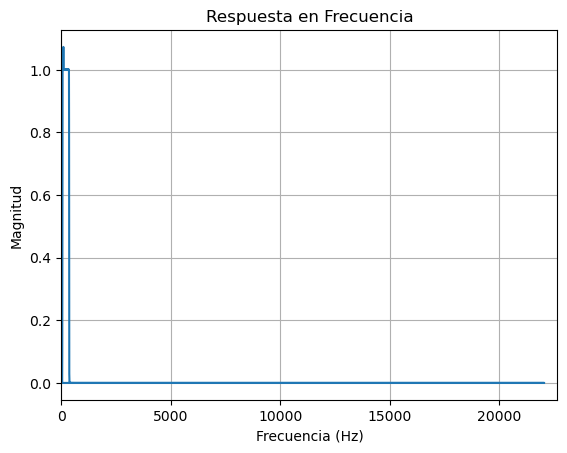

In [37]:
# Transformada de Fourier discreta (DFT)
frequencies = np.fft.fftfreq(len(filtro_compuesto), d=1/fs)
respuesta_frecuencia = np.fft.fft(filtro_compuesto)

# Graficar la respuesta en frecuencia
plt.plot(frequencies, np.abs(respuesta_frecuencia))
plt.title('Respuesta en Frecuencia')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud')
plt.grid(True)
plt.xlim(0,fc2+20)
plt.show()

# Espectro en frecuencia

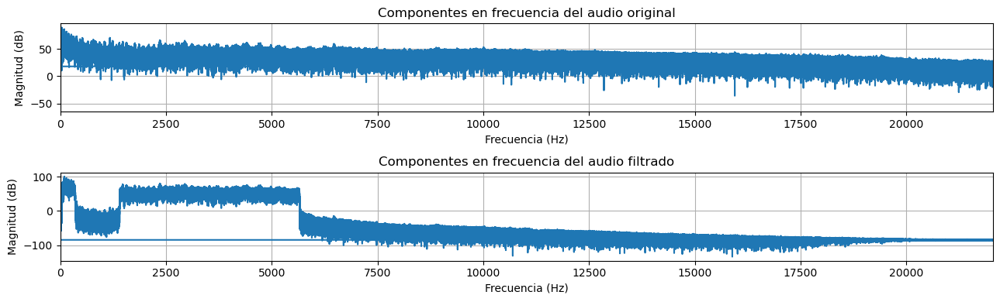

In [40]:
# Calcula la FFT para el audio original
audio_fft = np.fft.fft(audio)
audio_freq = np.fft.fftfreq(len(audio), 1/fs)

# Calcula la FFT para el audio filtrado
filtered_audio_fft = np.fft.fft(audio_filtrado)
filtered_audio_freq = np.fft.fftfreq(len(audio_filtrado), 1/fs)

# Crea el plot
plt.figure(figsize=(13,4))

# Dibuja el espectro del audio original
plt.subplot(2, 1, 1)
plt.plot(audio_freq, 20 * np.log10(np.abs(audio_fft)))
plt.title('Componentes en frecuencia del audio original')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud (dB)')  # Modificado para incluir dB
plt.grid()
plt.xlim(0, fs/2)

# Dibuja el espectro del audio filtrado
plt.subplot(2, 1, 2)
plt.plot(filtered_audio_freq, 20 * np.log10(np.abs(filtered_audio_fft)))
plt.title('Componentes en frecuencia del audio filtrado')
plt.xlabel('Frecuencia (Hz)')
plt.ylabel('Magnitud (dB)')  # Modificado para incluir dB
plt.grid()
plt.xlim(0, fs/2)

plt.tight_layout()
plt.show()
